# Little Sister
*Mohamed et Orkaëlle*

La société "Little Sister" est une entreprise spécialisée dans le secteur de la vidéosurveillance. Pour leur prochain produit, elle souhaite développer un algorithme d'intelligence artificielle afin de détecter les différents éléments présents sur une image. Elle vous sollicite afin de l'aider à réaliser le système.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import fct_utiles as fct
import CNN

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, AveragePooling2D, Dropout
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from keras.utils import to_categorical
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from keras.preprocessing import image
import numpy as np
plt.style.use('fivethirtyeight')

## 0 - Initialisation

In [3]:
# Téléchargement et décompression des données
fct.ensure_data_loaded()

Datas already downloaded.
Datas are successfully loaded.



In [101]:
# Choix des thèmes
objets = ['apple', 'forest', 'crocodile']

## 1 - Préparation des données

In [102]:
start = datetime.now()
fct.png_to_csv(objets, 500)
end = datetime.now()
print (f'Conversion effectuée en {end - start}')

All png files convert to a csv file.
Conversion effectuée en 0:00:12.612195


In [103]:
tf.random.set_seed(2)

In [104]:
# Split to train and test
x, y = CNN.load_dataset()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=5)

# Change type from int to float and normalize to [0, 1]
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

1440 train samples
360 test samples


In [105]:
# Convert class vectors to binary class matrices (transform the problem to multi-class classification)
num_classes = len(objets)
num_epoch = 10
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

In [106]:
test_image = "./DATAS/RAW/cifar-100/test/hamster/0075.png"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

## 2 - Entrainements

### TEST 1

In [107]:
modelName = 'model_test_1'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [108]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
flatten_10 (Flatten)         (None, 7200)              0         
_________________________________________________________________
dense_11 (Dense)             (None, 3)                 21603     
Total params: 22,499
Trainable params: 22,499
Non-trainable params: 0
_________________________________________________________________


In [109]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 2s 37ms/step - loss: 0.8366 - accuracy: 0.6201 - val_loss: 0.5994 - val_accuracy: 0.7833
Epoch 2/10
45/45 [==============================] - 2s 34ms/step - loss: 0.5510 - accuracy: 0.7646 - val_loss: 0.5019 - val_accuracy: 0.8000
Epoch 3/10
45/45 [==============================] - 1s 28ms/step - loss: 0.4792 - accuracy: 0.8056 - val_loss: 0.4659 - val_accuracy: 0.8167
Epoch 4/10
45/45 [==============================] - 1s 25ms/step - loss: 0.4354 - accuracy: 0.8319 - val_loss: 0.4394 - val_accuracy: 0.8278
Epoch 5/10
45/45 [==============================] - 1s 26ms/step - loss: 0.3933 - accuracy: 0.8486 - val_loss: 0.4259 - val_accuracy: 0.8444
Epoch 6/10
45/45 [==============================] - 2s 36ms/step - loss: 0.3725 - accuracy: 0.8549 - val_loss: 0.4308 - val_accuracy: 0.8306
Epoch 7/10
45/45 [==============================] - 1s 29ms/step - loss: 0.3336 - accuracy: 0.8722 - val_loss: 0.3760 - val_accuracy: 0.8611
Epoch 8/10
45

In [110]:
# Get loss and accuracy on validation set
score1 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', round(score1[1]*100,2))

Test loss: 0.33411961793899536
Test accuracy: 87.5


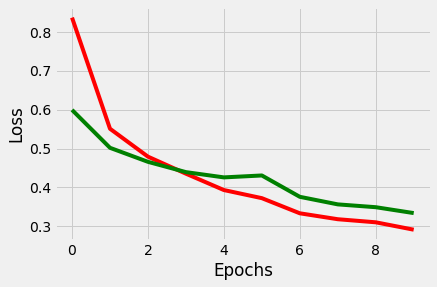

In [111]:
CNN.plot(training)

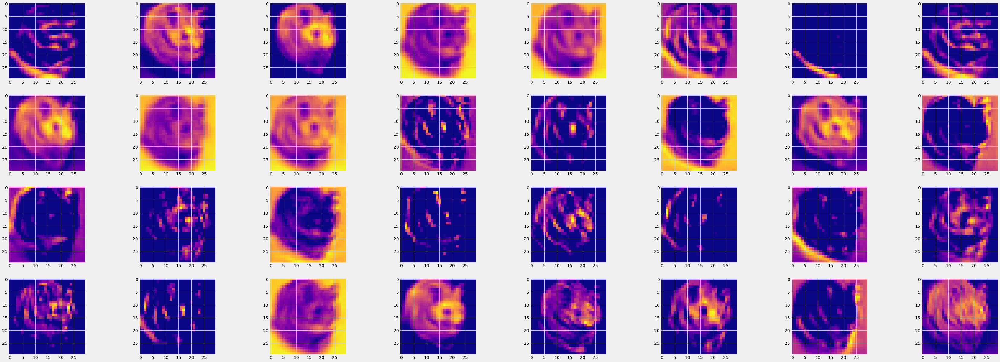

In [112]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

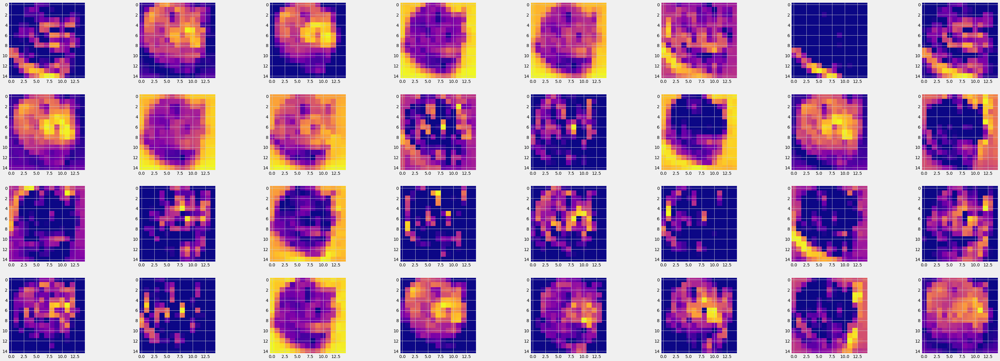

In [113]:
CNN.display_activation(activations, 8, 4, 1)

### TEST 2

In [114]:
modelName = 'model_test_2'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [115]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_17 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
flatten_11 (Flatten)         (None, 2304)              0         
_________________________________________________________________
dense_12 (Dense)             (None, 3)                 6915      
Total params: 26,307
Trainable params: 26,307
Non-trainable params: 0
_________________________________________________

In [116]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 3s 63ms/step - loss: 0.8394 - accuracy: 0.6083 - val_loss: 0.6426 - val_accuracy: 0.7528
Epoch 2/10
45/45 [==============================] - 2s 40ms/step - loss: 0.5791 - accuracy: 0.7528 - val_loss: 0.5243 - val_accuracy: 0.8000
Epoch 3/10
45/45 [==============================] - 3s 57ms/step - loss: 0.5134 - accuracy: 0.7951 - val_loss: 0.4598 - val_accuracy: 0.8194
Epoch 4/10
45/45 [==============================] - 2s 43ms/step - loss: 0.4794 - accuracy: 0.7951 - val_loss: 0.4449 - val_accuracy: 0.8250
Epoch 5/10
45/45 [==============================] - 2s 44ms/step - loss: 0.4162 - accuracy: 0.8368 - val_loss: 0.3942 - val_accuracy: 0.8333
Epoch 6/10
45/45 [==============================] - 2s 51ms/step - loss: 0.4048 - accuracy: 0.8389 - val_loss: 0.4288 - val_accuracy: 0.8111
Epoch 7/10
45/45 [==============================] - 2s 54ms/step - loss: 0.3590 - accuracy: 0.8646 - val_loss: 0.3767 - val_accuracy: 0.8472
Epoch 8/10
45

In [117]:
# Get loss and accuracy on validation set
score2 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score2[0])
print('Test accuracy:', round(score2[1]*100,2))

Test loss: 0.2886808514595032
Test accuracy: 89.17


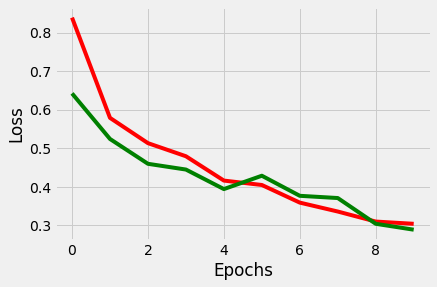

In [118]:
CNN.plot(training)

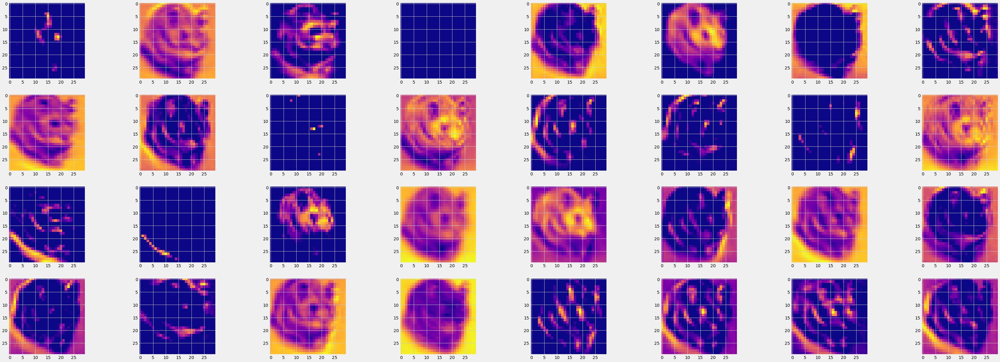

In [119]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

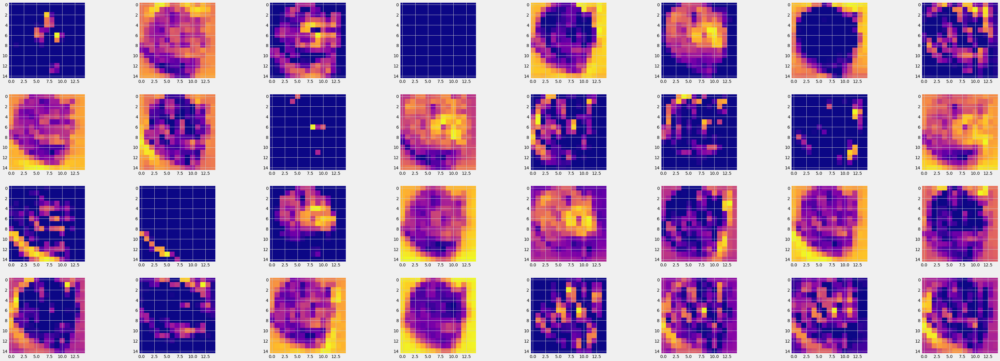

In [120]:
CNN.display_activation(activations, 8, 4, 1)

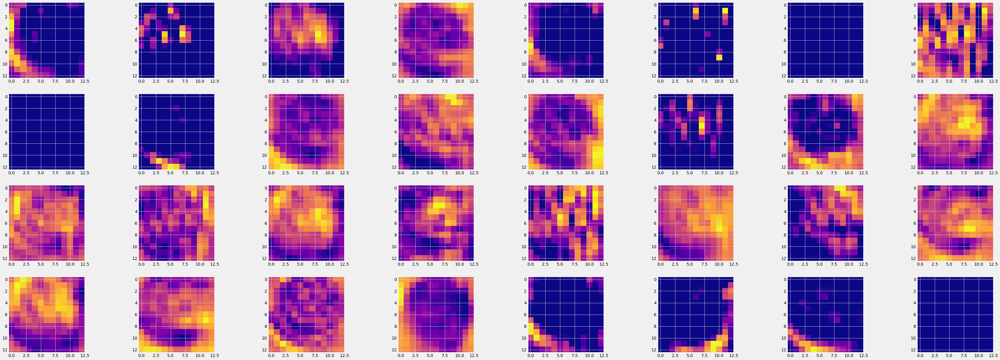

In [121]:
CNN.display_activation(activations, 8, 4, 2)

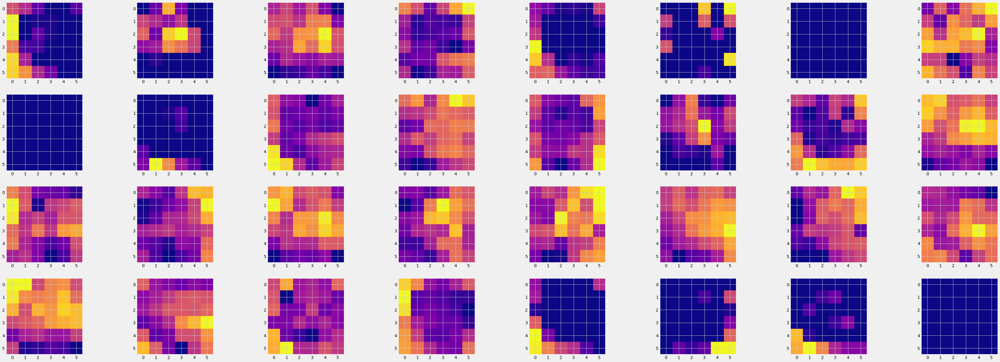

In [122]:
CNN.display_activation(activations, 8, 4, 3)

### TEST 3

In [179]:
modelName = 'model_test_3'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [180]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_31 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 2, 2, 128)         0         
_________________________________________________________________
flatten_17 (Flatten)         (None, 512)             

In [181]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 3s 66ms/step - loss: 0.8269 - accuracy: 0.6028 - val_loss: 0.6578 - val_accuracy: 0.6917
Epoch 2/10
45/45 [==============================] - 3s 71ms/step - loss: 0.5811 - accuracy: 0.7535 - val_loss: 0.5067 - val_accuracy: 0.8222
Epoch 3/10
45/45 [==============================] - 3s 59ms/step - loss: 0.5083 - accuracy: 0.7812 - val_loss: 0.4816 - val_accuracy: 0.8278
Epoch 4/10
45/45 [==============================] - 4s 79ms/step - loss: 0.4507 - accuracy: 0.8076 - val_loss: 0.4493 - val_accuracy: 0.8083
Epoch 5/10
45/45 [==============================] - 3s 71ms/step - loss: 0.4040 - accuracy: 0.8306 - val_loss: 0.4489 - val_accuracy: 0.8250
Epoch 6/10
45/45 [==============================] - 3s 56ms/step - loss: 0.3874 - accuracy: 0.8326 - val_loss: 0.3509 - val_accuracy: 0.8750
Epoch 7/10
45/45 [==============================] - 3s 56ms/step - loss: 0.3294 - accuracy: 0.8757 - val_loss: 0.3653 - val_accuracy: 0.8639
Epoch 8/10
45

In [182]:
# Get loss and accuracy on validation set
score3 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score3[0])
print('Test accuracy:', round(score3[1]*100,2))

Test loss: 0.3568836748600006
Test accuracy: 85.83


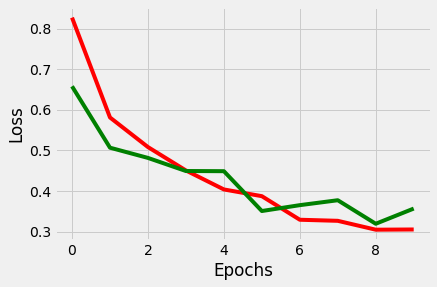

In [183]:
CNN.plot(training)

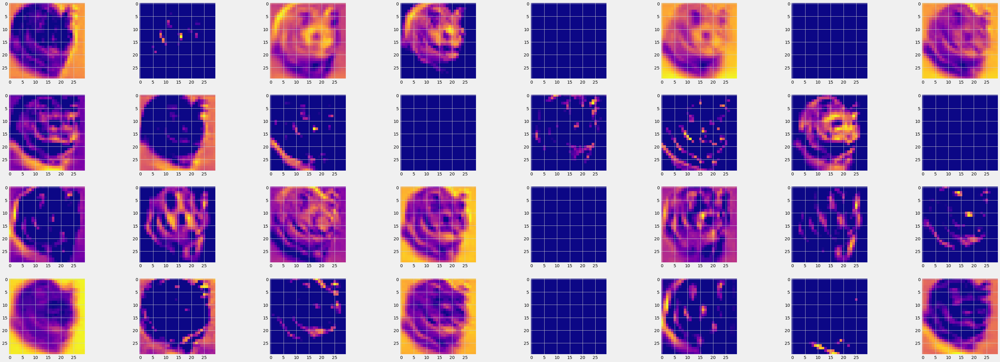

In [184]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

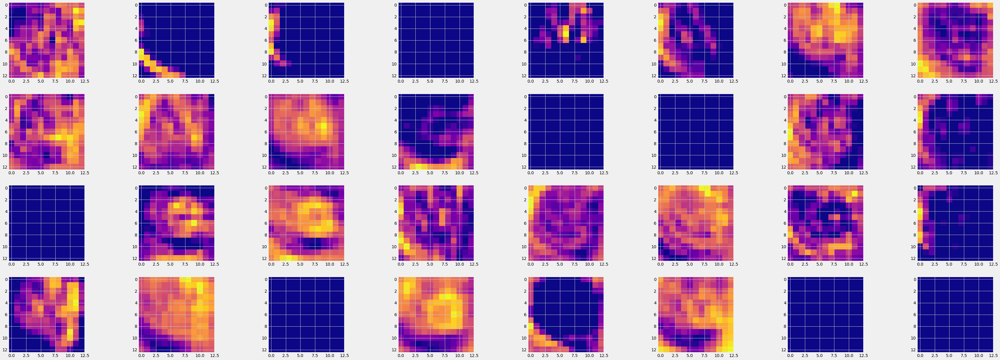

In [185]:
CNN.display_activation(activations, 8, 4, 2)

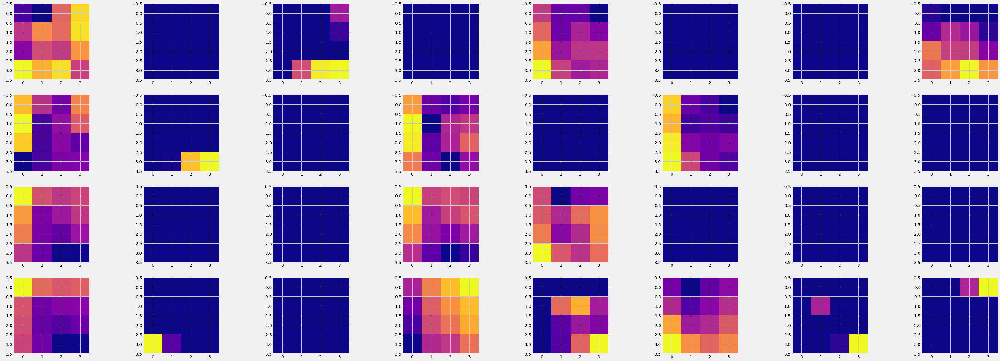

In [186]:
CNN.display_activation(activations, 8, 4, 4)

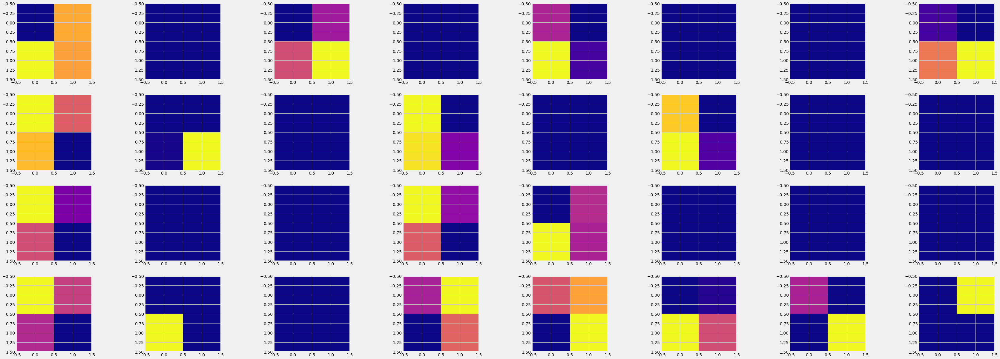

In [187]:
CNN.display_activation(activations, 8, 4, 5)

### Test 4

In [134]:
modelName = 'model_test_4'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [136]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dense(64, activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
dense_14 (Dense)             (None, 15, 15, 64)        2112      
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
flatten_13 (Flatten)         (None, 2304)              0         
_________________________________________________________________
dense_15 (Dense)             (None, 3)               

In [137]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 4s 80ms/step - loss: 0.8301 - accuracy: 0.6118 - val_loss: 0.6341 - val_accuracy: 0.7472
Epoch 2/10
45/45 [==============================] - 3s 75ms/step - loss: 0.6003 - accuracy: 0.7424 - val_loss: 0.5509 - val_accuracy: 0.8028
Epoch 3/10
45/45 [==============================] - 4s 78ms/step - loss: 0.5315 - accuracy: 0.7806 - val_loss: 0.4972 - val_accuracy: 0.8111
Epoch 4/10
45/45 [==============================] - 3s 73ms/step - loss: 0.4812 - accuracy: 0.7979 - val_loss: 0.4750 - val_accuracy: 0.8167
Epoch 5/10
45/45 [==============================] - 4s 83ms/step - loss: 0.4394 - accuracy: 0.8167 - val_loss: 0.4450 - val_accuracy: 0.8306
Epoch 6/10
45/45 [==============================] - 4s 85ms/step - loss: 0.4219 - accuracy: 0.8146 - val_loss: 0.4103 - val_accuracy: 0.8139
Epoch 7/10
45/45 [==============================] - 3s 70ms/step - loss: 0.3957 - accuracy: 0.8354 - val_loss: 0.4552 - val_accuracy: 0.7972
Epoch 8/10
45

In [138]:
# Get loss and accuracy on validation set
score4 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score4[0])
print('Test accuracy:', round(score4[1]*100,2))

Test loss: 0.3307700753211975
Test accuracy: 86.39


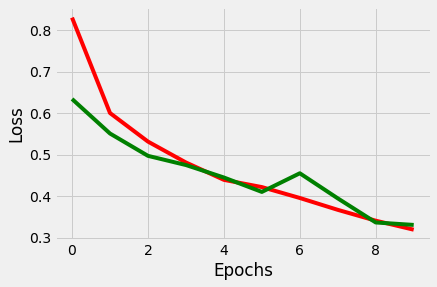

In [139]:
CNN.plot(training)

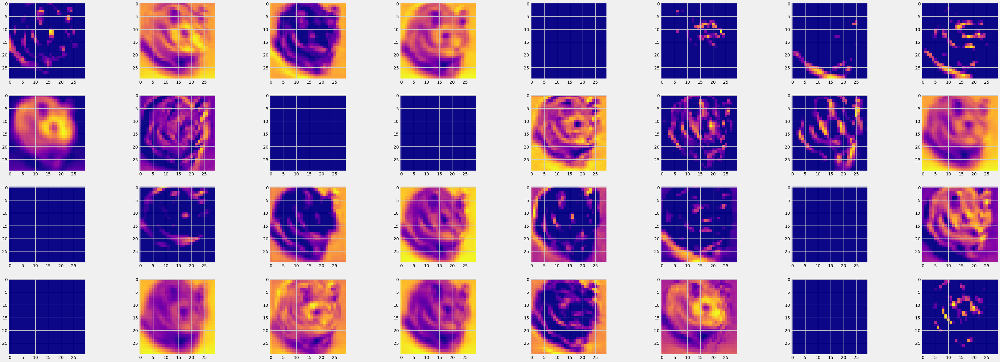

In [144]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

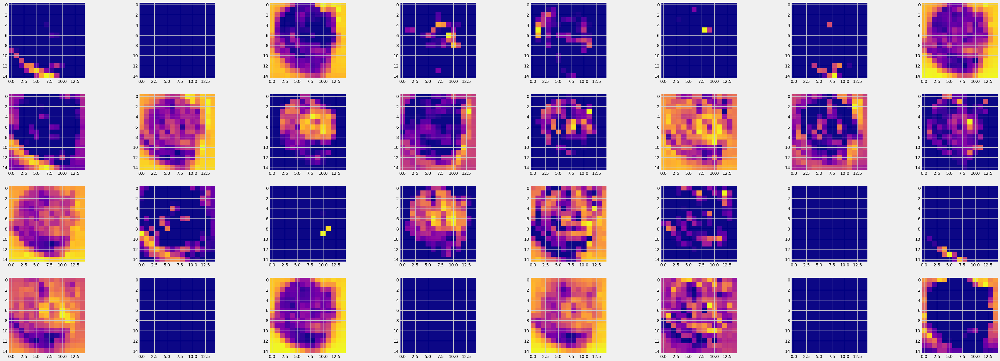

In [145]:
CNN.display_activation(activations, 8, 4, 2)

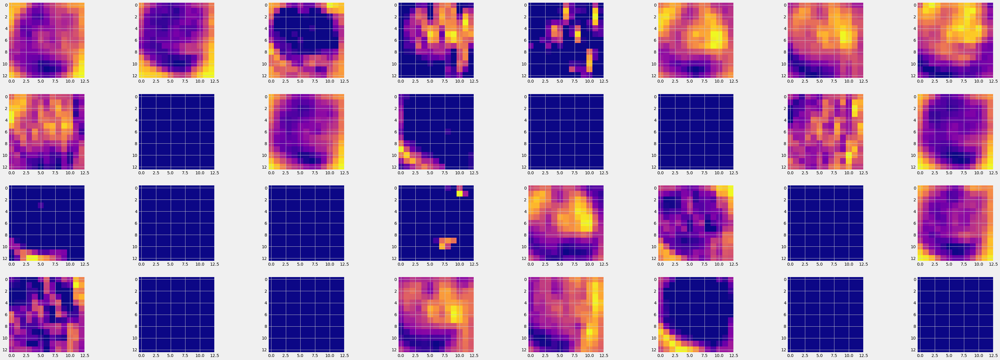

In [146]:
CNN.display_activation(activations, 8, 4, 3)

### TEST 5

In [147]:
modelName = 'model_test_5'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [148]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Dense(300, activation='relu'))
model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 28, 28, 64)        18496     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
dense_16 (Dense)             (None, 14, 14, 300)       19500     
_________________________________________________________________
flatten_14 (Flatten)         (None, 58800)             0         
_________________________________________________________________
dense_17 (Dense)             (None, 3)               

In [149]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 8s 175ms/step - loss: 0.8609 - accuracy: 0.5986 - val_loss: 0.5941 - val_accuracy: 0.7861
Epoch 2/10
45/45 [==============================] - 8s 184ms/step - loss: 0.5790 - accuracy: 0.7403 - val_loss: 0.5017 - val_accuracy: 0.8000
Epoch 3/10
45/45 [==============================] - 9s 195ms/step - loss: 0.4705 - accuracy: 0.8062 - val_loss: 0.4670 - val_accuracy: 0.8111
Epoch 4/10
45/45 [==============================] - 8s 181ms/step - loss: 0.4339 - accuracy: 0.8160 - val_loss: 0.4162 - val_accuracy: 0.8278
Epoch 5/10
45/45 [==============================] - 9s 193ms/step - loss: 0.3622 - accuracy: 0.8611 - val_loss: 0.3264 - val_accuracy: 0.8861
Epoch 6/10
45/45 [==============================] - 8s 178ms/step - loss: 0.3020 - accuracy: 0.8813 - val_loss: 0.3604 - val_accuracy: 0.8444
Epoch 7/10
45/45 [==============================] - 8s 179ms/step - loss: 0.2314 - accuracy: 0.9056 - val_loss: 0.3299 - val_accuracy: 0.8694
Epoch 

In [150]:
# Get loss and accuracy on validation set
score5 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score5[0])
print('Test accuracy:', round(score5[1]*100,2))

Test loss: 0.28679728507995605
Test accuracy: 89.72


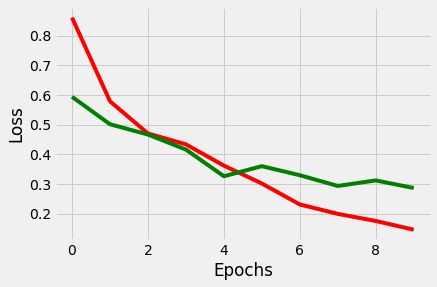

In [151]:
CNN.plot(training)

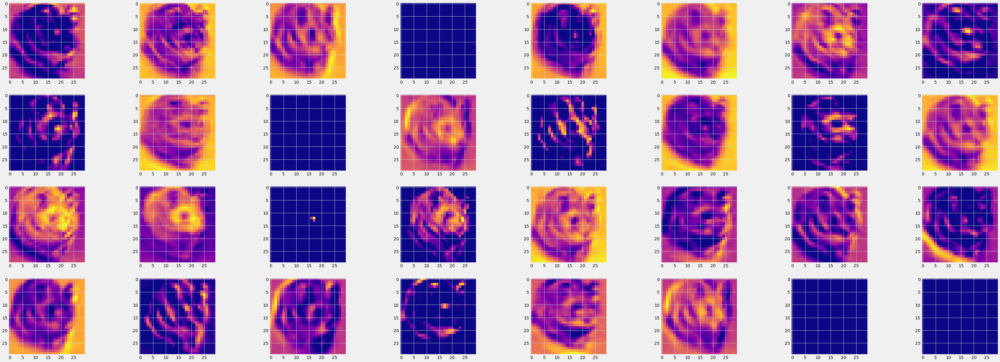

In [152]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

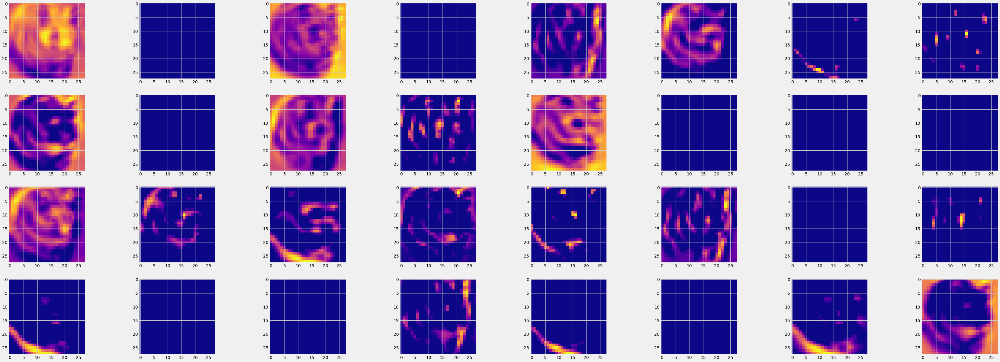

In [153]:
CNN.display_activation(activations, 8, 4, 1)

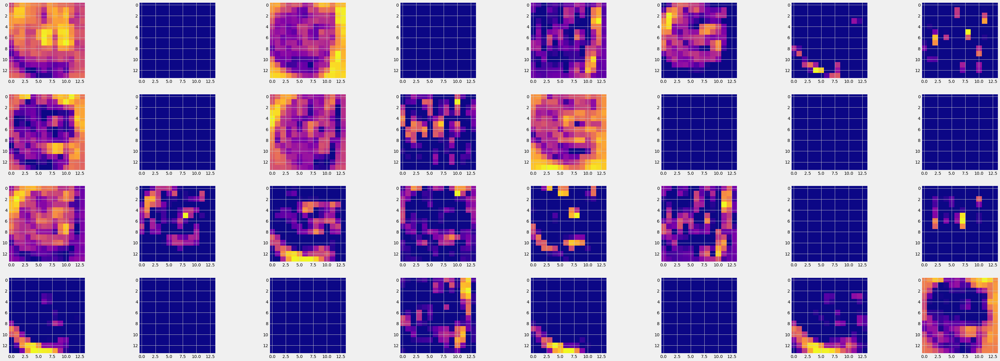

In [154]:
CNN.display_activation(activations, 8, 4, 3)

### TEST 6

In [157]:
modelName = 'model_test_6'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [158]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_27 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 28, 28, 64)        18496     
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
flatten_15 (Flatten)         (None, 12544)             0         
_________________________________________________________________
dense_18 (Dense)             (None, 128)               1605760   
_________________________________________________________________
dropout_6 (Dropout)          (None, 128)             

In [159]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 8s 179ms/step - loss: 0.8306 - accuracy: 0.6236 - val_loss: 0.5614 - val_accuracy: 0.7806
Epoch 2/10
45/45 [==============================] - 7s 158ms/step - loss: 0.6136 - accuracy: 0.7347 - val_loss: 0.6090 - val_accuracy: 0.6556
Epoch 3/10
45/45 [==============================] - 9s 191ms/step - loss: 0.5080 - accuracy: 0.7861 - val_loss: 0.4319 - val_accuracy: 0.8361
Epoch 4/10
45/45 [==============================] - 6s 138ms/step - loss: 0.4307 - accuracy: 0.8292 - val_loss: 0.3834 - val_accuracy: 0.8500
Epoch 5/10
45/45 [==============================] - 8s 172ms/step - loss: 0.3726 - accuracy: 0.8542 - val_loss: 0.3325 - val_accuracy: 0.8667
Epoch 6/10
45/45 [==============================] - 6s 136ms/step - loss: 0.3124 - accuracy: 0.8660 - val_loss: 0.3222 - val_accuracy: 0.8611
Epoch 7/10
45/45 [==============================] - 9s 201ms/step - loss: 0.2683 - accuracy: 0.9049 - val_loss: 0.3422 - val_accuracy: 0.8806
Epoch 

In [160]:
# Get loss and accuracy on validation set
score6 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score6[0])
print('Test accuracy:', round(score6[1]*100,2))

Test loss: 0.2398850917816162
Test accuracy: 91.67


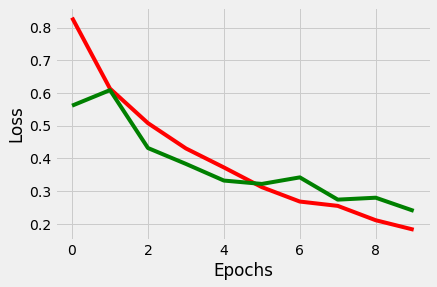

In [161]:
CNN.plot(training)

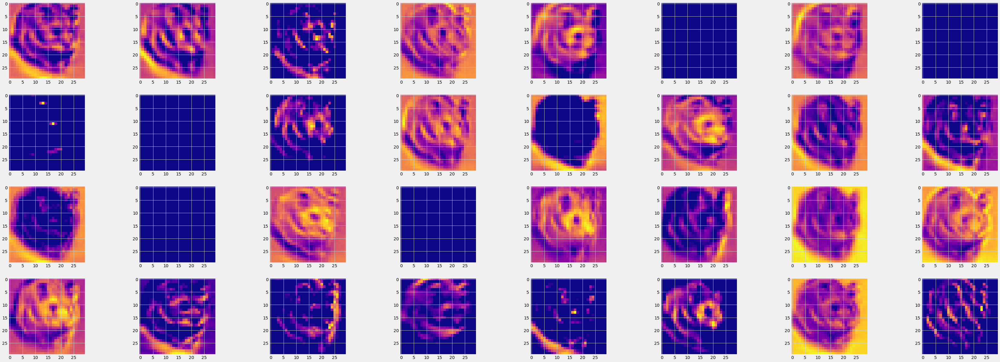

In [162]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

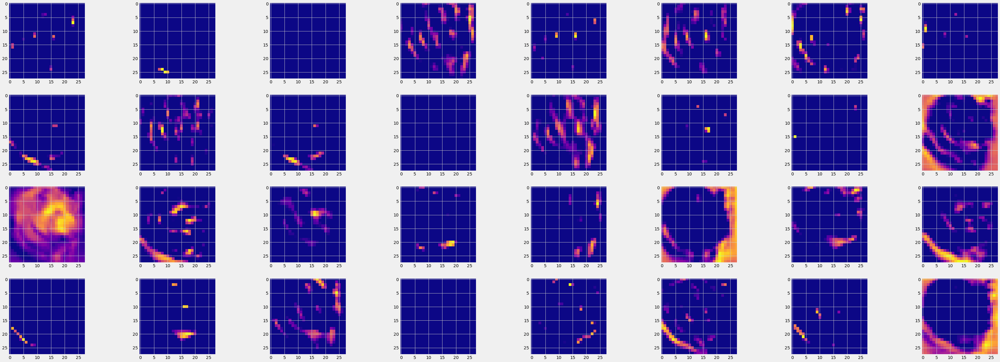

In [164]:
CNN.display_activation(activations, 8, 4, 1)

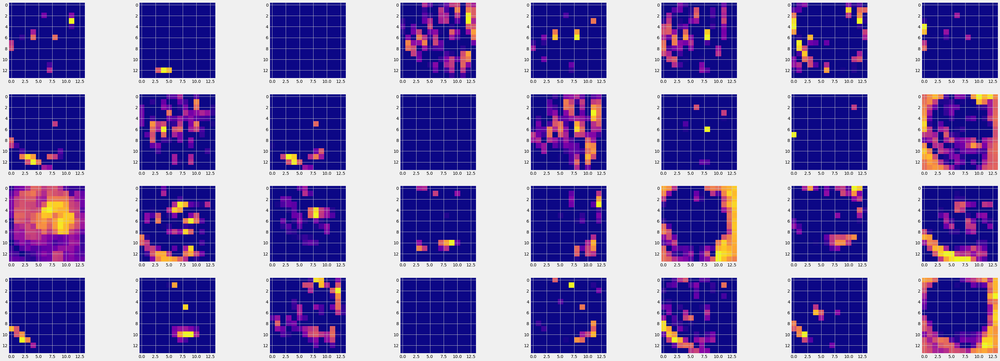

In [167]:
CNN.display_activation(activations, 8, 4, 2)

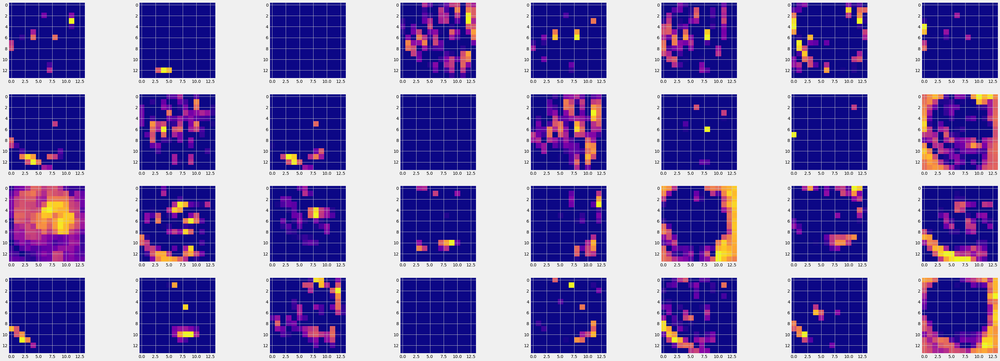

In [168]:
CNN.display_activation(activations, 8, 4, 3)

### TEST 7

In [169]:
modelName = 'model_test_7'
modelPath = fct.MODELS_LOCAL_PATH + modelName + '.h5'

In [170]:
# Set the model
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32,32,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(AveragePooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_29 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 28, 28, 64)        18496     
_________________________________________________________________
average_pooling2d_2 (Average (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
flatten_16 (Flatten)         (None, 12544)             0         
_________________________________________________________________
dense_20 (Dense)             (None, 128)               1605760   
_________________________________________________________________
dropout_8 (Dropout)          (None, 128)             

In [171]:
# Train the model
training = model.fit(x_train, y_train, batch_size=32, epochs=num_epoch, verbose=1, validation_data=(x_test, y_test))

# Save the model
model.save(modelPath)

Epoch 1/10
45/45 [==============================] - 7s 149ms/step - loss: 0.9506 - accuracy: 0.5562 - val_loss: 0.6887 - val_accuracy: 0.7250
Epoch 2/10
45/45 [==============================] - 7s 153ms/step - loss: 0.6102 - accuracy: 0.7410 - val_loss: 0.5087 - val_accuracy: 0.8056
Epoch 3/10
45/45 [==============================] - 7s 166ms/step - loss: 0.5290 - accuracy: 0.7861 - val_loss: 0.4869 - val_accuracy: 0.8222
Epoch 4/10
45/45 [==============================] - 7s 161ms/step - loss: 0.4721 - accuracy: 0.7951 - val_loss: 0.4107 - val_accuracy: 0.8333
Epoch 5/10
45/45 [==============================] - 7s 162ms/step - loss: 0.4056 - accuracy: 0.8368 - val_loss: 0.3775 - val_accuracy: 0.8583
Epoch 6/10
45/45 [==============================] - 8s 169ms/step - loss: 0.3406 - accuracy: 0.8618 - val_loss: 0.3801 - val_accuracy: 0.8444
Epoch 7/10
45/45 [==============================] - 8s 169ms/step - loss: 0.3037 - accuracy: 0.8847 - val_loss: 0.3375 - val_accuracy: 0.8694
Epoch 

In [172]:
# Get loss and accuracy on validation set
score7 = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score7[0])
print('Test accuracy:', round(score7[1]*100,2))

Test loss: 0.28702858090400696
Test accuracy: 90.56


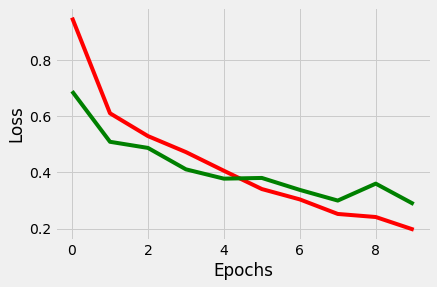

In [173]:
CNN.plot(training)

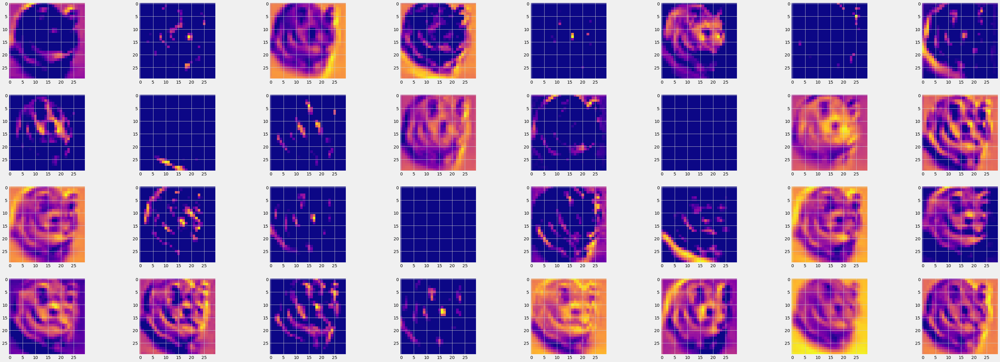

In [174]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

CNN.display_activation(activations, 8, 4, 0)

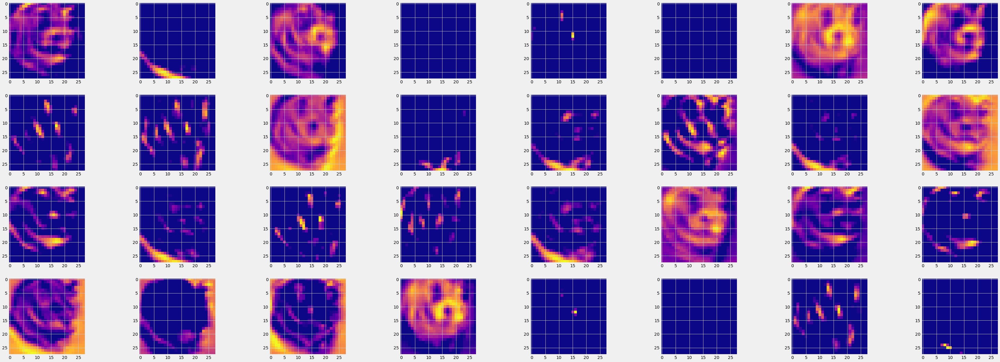

In [175]:
CNN.display_activation(activations, 8, 4, 1)

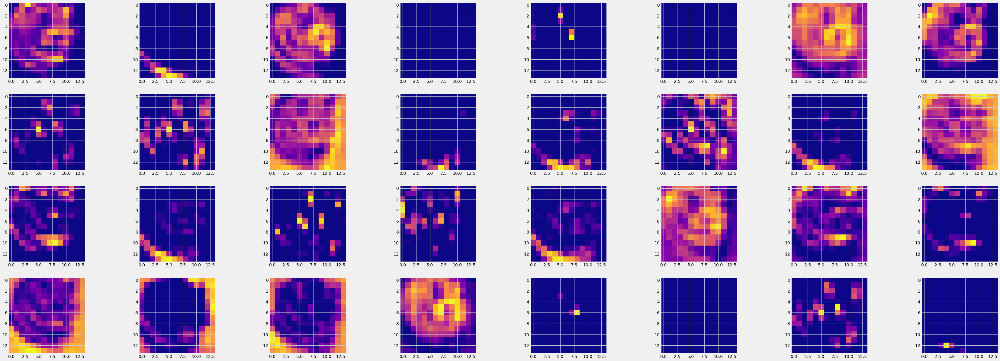

In [176]:
CNN.display_activation(activations, 8, 4, 2)

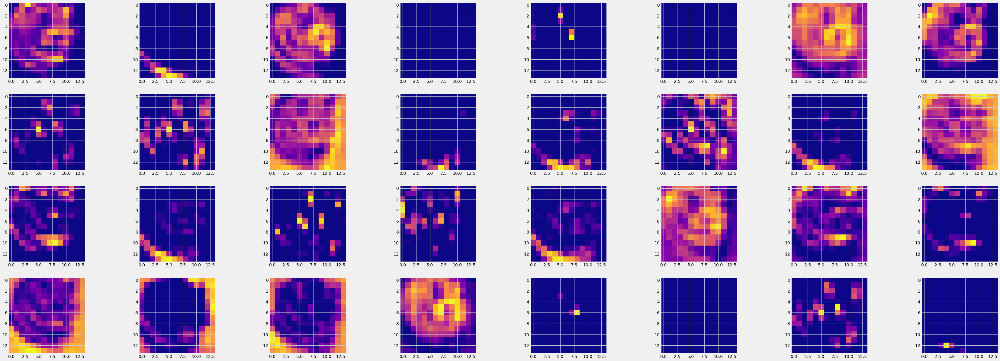

In [177]:
CNN.display_activation(activations, 8, 4, 3)

## 3 - Comparaisons des résultats

In [188]:
print ('Accuracies :\n')
print (f'Model #1 : {round(score1[1]*100,2)} %')
print (f'Model #2 : {round(score2[1]*100,2)} %')
print (f'Model #3 : {round(score2[1]*100,2)} %')
print (f'Model #4 : {round(score4[1]*100,2)} %')
print (f'Model #5 : {round(score5[1]*100,2)} %')
print (f'Model #6 : {round(score6[1]*100,2)} %')
print (f'Model #7 : {round(score7[1]*100,2)} %')

Accuracies :

Model #1 : 87.5 %
Model #2 : 89.17 %
Model #3 : 89.17 %
Model #4 : 86.39 %
Model #5 : 89.72 %
Model #6 : 91.67 %
Model #7 : 90.56 %
